In [1]:
# GeoTiff images
import rasterio
from   osgeo import gdal


# data visualisation
from   matplotlib        import pyplot as plt
from   matplotlib.pyplot import figure
import matplotlib.image  as img
from   PIL               import Image


# model building
import ultralytics
from   ultralytics import YOLO
import labelme2yolo


# others
import os
import shutil
import zipfile

In [2]:
# supress warnings (be careful while using this)
import warnings
warnings.filterwarnings('ignore')

# import common GIS tools
import numpy                   as np
import xarray                  as xr
import matplotlib.pyplot       as plt
import rasterio.features
import rioxarray               as rio
from matplotlib.cm import RdYlGn, Reds

# import Planetary Computer tools
import pystac_client
import planetary_computer as pc
import odc
from odc.stac import stac_load

# additional libraries
from datetime import date # date-related calculations

# Introduction

    We undertook a challenge that revolved around the devastating impact of Hurricane Maria, which struck Puerto Rico in 2017. This challenge involved analyzing pre- and post-event satellite images of the entire map of San Juan, Puerto Rico. We used an object detection model that reached a MAP score around 0.75 and helped to identify 4 types of buildings: Damaged Residential, Damaged Commercial, Undamaged Residential, and Undamaged Commercial.
    After experimenting with two methods, we opted for using a larger dataset despite its lower precision, prioritizing scalability and a higher MAP score to address widespread impact. The model faced challenges with class imbalance, which negatively affected the detection of damaged buildings. Our findings are applicable in various domains such as infrastructure planning, durable construction, area zoning, insurance, disaster simulations, and historical analyses.



## Top Three Actionable Recommendations

    1. Creating automated algorithms of Machine Learning that will have real-time surface level vision. They would analyze data and provide the fastest possible response to affected areas. Such an approach involves pre-trained data that adds new data and learns from it, providing an edge over other techniques aimed at solving similar problems. Moreover, automation of alerts would eliminate the need for constant human control, reducing maintenance costs and alternative methods. This could become the most responsive tool for such disasters when applying more data and adding real-time information.
    2. Enhancing data with alternative sources of imagery like drones, ground-based footage, and even live social media updates. Such an approach will allow for a better identification of affected areas combined with Machine Learning algorithms that are trained on various features. It will provide a deeper understanding of how buildings are damaged from sides or closer distances, allowing for a more detailed examination and assessment of the areas. Bringing multi-source training will expand business uses. Besides that, it will provide more value to citizens' safety as well as the government’s reaction to such events.
    3. Based on further dataset analysis and comparison of buildings that were damaged versus undamaged, we propose that particular building structures could be identified as 'stronger'—as fewer of them were destroyed—and 'weaker' structures respectively. This could be helpful for future building initiatives to combat similar events. Some more affected areas could be identified as "more dangerous" and appropriate strategies for habitation there could be created. Such an approach will be helpful to evaluate infrastructure and areas of Puerto Rico that have higher chances of damage. Further, '911' locations could be placed closer, and in similar events, the reaction time to help people would be drastically faster.



## Model Analysis + Insights

    We use the 'Y8x' pre-trained model, which is the largest YOLO-v8 model available. It requires significant resources, therefore, we use 'runpod.io' to rent powerful GPUs for model training. Initially, we used a set of images that had fewer buildings and were relatively easier to classify to establish a baseline for our model. After this initial phase, we expanded our dataset to include a total of 125 images that were densely populated with buildings in various conditions, to increase the complexity and realism of our training data. This total includes both pre-event and post-event pictures, specifically 38 pre-event and 87 post-event images. We identified the area of each specific tile on Google Maps and meticulously went through every single building, cross-checking and verifying each type of building—commercial, residential, damaged, or undamaged. This process revealed the multitude of variables present in each image, highlighting the challenges in labeling. This step was crucial in refining our model’s ability to accurately classify complex urban environments. The baseline model showed a 0.38 MAP score. To improve the result, we applied some data augmentation techniques:

    1) Flipping images upside down and from left to right. By that the dataset diversity is increased and its reasonable transformation as buildings orientation does not matter and can be any when satellite photo is made.
    2) Increasing saturation/brightness. That helps the model to better recognize objects. As we do not classify things based on saturation/brightness it’s a reasonable transformation.
    3) Custom rotation. (Same as #1)
    4) Zoom and scale. (Same as #1)
    5) Image combination. We combine from 2 to 4 images into one creating a composite image. Enhances the model's ability to generalize by introducing label noise and visual variability.
    6)Copying objects from one image and pasting them onto another, useful for increasing object instances and learning object occlusion.

    All of the above increased the score up to 0.45. We can see that object detection models require a much larger dataset to be trained. So, we switched to a pre-labeled dataset on Roboflow consisting of thousands of tiles already labeled. We gave up some quality of labeling to gain a larger dataset and this trade-off turned out to be valuable as we achieved a MAP score around 0.75. It was enough to make 100 epochs with a batch-size of 32 without augmentation to achieve such a score. However, we expect that the final evaluation result will be affected by the bias of labeling for this dataset and as a prospect for improvement, we would label thousands of images manually, taking into account information from Google Maps and additional sources to achieve good precision in labeling.



### Additional Insights:

    - The city of Puerto Rico had many damaged buildings, some of which were already in disrepair before the hurricane.
    - Upon analyzing Google Maps, it was noted that many commercial buildings are located on road curves, likely because this provides greater visibility and easier access.
    - Another observation was that there were many areas where residential and commercial buildings alternated, both having the same size and color. Without the use of Google Maps, it was difficult to distinguish them.
    - There are residential blocks where lines of residential houses have walls parallel and adjacent to lines of commercial houses (of the same size). This might indicate that in some areas, there is a preference to have all commercial premises on one side. This complicates the identification of commercial buildings from residential ones without Google Maps.
    - Typically, residential areas had red roofs, though not consistently so, and both building types sometimes had white or gray roofs, complicating identification. 
    - Errors were found in the dataset where a roof of a building was expected, but instead, it was a courtyard, parking lot, or well-maintained driveways. The use of Google Maps helped to understand these discrepancies.
    - Some roofs in the images post-event appeared damaged or different from before, but this was not necessarily an indicator of a destroyed building. Higher-definition images showed that these were branches or leaves from trees destroyed by the event.
    - A recurring pattern found in buildings destroyed by the hurricane was the dark brown/orange color of some parts of the roofs (not bright colors), which was due to the roofs losing some parts, leaving parts of the frame visible. Many other roofs might have appeared destroyed, but actually, they were buildings already damaged before the hurricane.



## Conclusion
    We identified effective strategies to enhance ML algorithm performance, balancing time and budget constraints. Ideally, integrating human labeling with Google Maps would refine accuracy, requiring analysis of thousands of images for optimal results. This approach, though less precise initially, can improve as the model labels new data, maximizing long-term efficiency. We recommend this development strategy to extend reach and minimize costs. Implementing this algorithm could greatly enhance the quality of life in Puerto Rico by providing sturdier infrastructure, improved building designs, and quicker emergency responses.



### Our team would implement/improve if we were given three months to work on this project

    Our team had a few main challenges which are related to classification of objects and scaling labels throughout a larger dataset. If we had three more months, we would create an automated Machine Learning algorithm that would identify building types and their “damage” status based on the 3 parameters: pre- and post-event images from the satellite and Google Maps (or a substitute). First, the model would identify which buildings are residential and commercial, which would work based on the pre-event imagery from the satellite and aligning it with Google Maps. It would provide the highest precision and lower cost. Further, the outcome - labeled images - would be aligned with the post-event image to identify the buildings affected by the hurricane.
    This algorithm would use supervised learning (based on Google Maps) and further create a best strategy to identify classes/labels needed for the object detection. This output could be implemented for similar challenges and utilized not only to identify buildings affected by hurricanes but also improve ML algorithms that are utilized in military, insurance for houses, and building conditions. It could be spinned off to identify which buildings had the highest “survival rate” and create similar structures for a better climate resistance. 


____
### Consideration
    *(The following parts are not included in the word count)

    We found the challenge of applying real object detection techniques to a concrete case immensely educational and rewarding. It was extremely interesting to discover how our work on distinguishing between damaged and undamaged buildings could significantly benefit sectors such as insurance and disaster response teams. This potential to enable swift and informed actions in the aftermath of disasters added a meaningful and practical dimension to our learning experience. Additionally, the opportunity to have a call with an expert from NASA was invaluable. It deepened our understanding and fuelled our enthusiasm to apply these technologies in real-world scenarios.


### Area for Improvement

    While the challenge was highly instructive, we believe there is room for improvement in defining the criteria for what constitutes 'damage' in the training models. Refining these definitions could lead to more accurate assessments, which is critical for all subsequent decision-making processes. Moreover, incorporating a robust user feedback mechanism would significantly enhance the adaptability and reliability of the models. This would allow for ongoing improvements based on real-world application and feedback, ensuring that the models remain relevant and effective under varied and changing conditions. Further, enhancing the dataset with more diverse examples of damage from different disasters around the world could provide broader learning opportunities and improve the model's generalizability, making it more versatile and applicable across different geographic and environmental contexts. These enhancements are crucial for maximizing the utility and effectiveness of the models in diverse and dynamic disaster management settings.


____
### References:

    Artefact. (n.d.). Applying machine learning algorithms to satellite imagery for agriculture applications. Artefact. Retrieved [ 22 April, 2024], from https://www.artefact.com/blog/applying-machine-learning-algorithms-to-satellite-imagery-for-agriculture-applications/ 

    LaTourrette, T., Miller, B. M., Ulin, T., Van Abel, K., Langeland, K. S., & Nanda, N. (n.d.). Public buildings in Puerto Rico after Hurricane Maria: Prestorm challenges, hurricane damage, and suggested courses of action for recovery. Homeland Security Operational Analysis Center (HSOAC), RAND Corporation. Retrieved from https://www.preventionweb.net/publication/public-buildings-puerto-rico-after-hurricane-maria-prestorm-challenges-hurricane-damage
   
    National Aeronautics and Space Administration. (2024). How does a hurricane form? SciJinks. https://scijinks.gov/hurricane/ 

    Puerto Rico Building Code. (2018). Adoption info: Effective dates November 15, 2018 - Present. Adopts with amendments International Building Code 2018 (IBC 2018). Retrieved from https://up.codes/viewer/puerto_rico/ibc-2018

    Viasat. (n.d.). How satellites play a role in disaster relief. Viasat Corporate Blog. Retrieved [ 20 April, 2024], from https://news.viasat.com/blog/corporate/how-satellites-play-a-role-in-disaster-relief 

    Weather Forecast Office. (2017). Major Hurricane Maria - September 20, 2017. Retrieved from https://www.weather.gov/sju/major_hurricane_maria

    Weather Forecast Office. (2017). Hurricane Irma - September 5-7, 2017. Retrieved from https://www.weather.gov/sju/hurricane_irma 

## Getting Data
In this part we download satellite data for Puerto Rico coordinates. Time period covers both pre-hurricane and post-hurricane dates.

We display some of the examples below

In [3]:
## Hurricane Maria - San Juan, Puerto Rico ##

# Define the bounding box for the entire data region 
min_lon = -66.19385887
min_lat =  18.27306794
max_lon = -66.08007533
max_lat =  18.48024350


# setting geographic boundary
bounds = (min_lon, min_lat, max_lon, max_lat)


# setting time window
time_window = "2017-01-01/2018-01-01"

In [4]:
# connecting to the planetary computer
stac = pystac_client.Client.open("https://planetarycomputer.microsoft.com/api/stac/v1")


# seaching for data
search = stac.search(collections = ["sentinel-2-l2a"],
                     bbox        = bounds,
                     datetime    = time_window)


# instantiating results list
items = list(search.get_all_items())


# summarizing results
print('This is the number of scenes that touch our region:',len(items))

This is the number of scenes that touch our region: 101


In [5]:
# checking individual results
for item in items[0:5]:
    print(item)

<Item id=S2B_MSIL2A_20171229T150709_R082_T19QHA_20201014T171652>
<Item id=S2B_MSIL2A_20171229T150709_R082_T19QGA_20201014T171649>
<Item id=S2A_MSIL2A_20171224T150711_R082_T19QHA_20201014T160213>
<Item id=S2A_MSIL2A_20171224T150711_R082_T19QGA_20201014T160212>
<Item id=S2B_MSIL2A_20171219T150709_R082_T19QHA_20201014T151203>


In [6]:
# pixel resolution for the final product
resolution = 10  # meters per pixel 


# scaling to degrees per pizel
scale = resolution / 111320.0 # degrees per pixel for CRS:4326 

In [7]:
xx = stac_load(
    items,
    bands      = ["red", "green", "blue", "nir", "SCL"],
    crs        = "EPSG:4326",                            # latitude-longitude
    resolution = scale,                                  # degrees
    chunks     = {"x": 2048, "y": 2048},
    dtype      = "uint16",
    patch_url  = pc.sign,
    bbox       = bounds
)

In [8]:
# view the dimensions of our XARRAY and the variables
display(xx)

<xarray.Dataset>
Dimensions:      (latitude: 2308, longitude: 1268, time: 52)
Coordinates:
  * latitude     (latitude) float64 18.48 18.48 18.48 ... 18.27 18.27 18.27
  * longitude    (longitude) float64 -66.19 -66.19 -66.19 ... -66.08 -66.08
    spatial_ref  int32 4326
  * time         (time) datetime64[ns] 2017-01-08T15:07:11.026000 ... 2017-12...
Data variables:
    red          (time, latitude, longitude) uint16 dask.array<chunksize=(1, 2048, 1268), meta=np.ndarray>
    green        (time, latitude, longitude) uint16 dask.array<chunksize=(1, 2048, 1268), meta=np.ndarray>
    blue         (time, latitude, longitude) uint16 dask.array<chunksize=(1, 2048, 1268), meta=np.ndarray>
    nir          (time, latitude, longitude) uint16 dask.array<chunksize=(1, 2048, 1268), meta=np.ndarray>
    SCL          (time, latitude, longitude) uint16 dask.array<chunksize=(1, 2048, 1268), meta=np.ndarray>

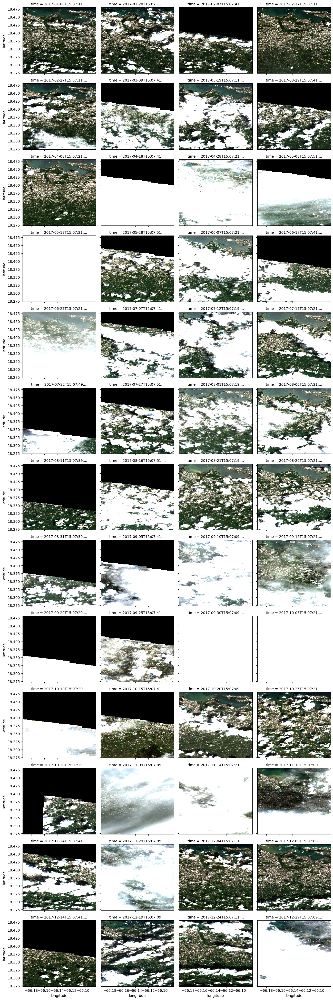

In [9]:
## This code will take some time to process ##

# subsetting results for RGB
plot_xx = xx[ ["red", "green", "blue"] ].to_array()


# showing results 
plot_xx.plot.imshow(col      = 'time', # time
                    col_wrap = 4     , # four columns per row
                    robust   = True  , 
                    vmin     = 0     ,
                    vmax     = 3000  )


# rendering results
plt.show()

In [16]:
# select a time slice to view a single RGB image and the cloud mask
# see the xarray dimensions above for the number of time slices (starts at 0)

time_slice = 47 # December 9, 2017 (post-storm)

In [17]:
import matplotlib.pyplot as plt

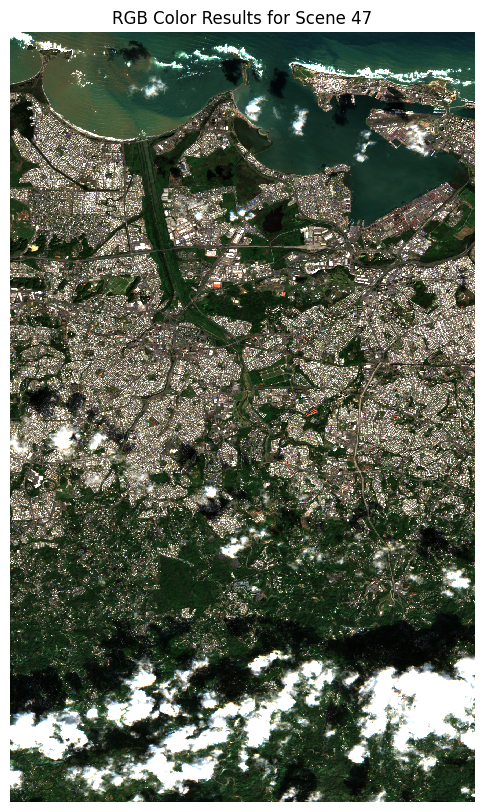

In [18]:
## plotting an RGB real color image for a single date ##

# setting plot size
fig, ax = plt.subplots( figsize = (6, 10) )


# preparing the plot
xx.isel(time = time_slice)[ ["red", "green", "blue"] ].\
    to_array().plot.imshow(robust = True,
                           ax     = ax  ,
                           vmin   = 0   ,
                           vmax   = 3000)


# titles and axis lables
ax.set_title(label = f"RGB Color Results for Scene {time_slice}")
ax.axis('off')


# rendering results
plt.show()

## Images analysis

We colorize images recognizing noisy elements such as clouds, water etc.

Afterwards we measure vegetation level (NDVI) to highlight buildings and to compare pre-event state with post-event state. It will be used to recognize the area having most dramatic change to analyze it further.

In [19]:
# instantiating a colormap for SCL pixel classifications

scl_colormap = np.array(
    [
        [252,  40, 228, 255],  # 0  - NODATA - MAGENTA
        [255,   0,   4, 255],  # 1  - Saturated or Defective - RED
        [0  ,   0,   0, 255],  # 2  - Dark Areas - BLACK
        [97 ,  97,  97, 255],  # 3  - Cloud Shadow - DARK GREY
        [3  , 139,  80, 255],  # 4  - Vegetation - GREEN
        [192, 132,  12, 255],  # 5  - Bare Ground - BROWN
        [21 , 103, 141, 255],  # 6  - Water - BLUE
        [117,   0,  27, 255],  # 7  - Unclassified - MAROON
        [208, 208, 208, 255],  # 8  - Cloud - LIGHT GREY
        [244, 244, 244, 255],  # 9  - Definitely Cloud - WHITE
        [195, 231, 240, 255],  # 10 - Thin Cloud - LIGHT BLUE
        [222, 157, 204, 255],  # 11 - Snow or Ice - PINK
    ],
    dtype="uint8",
)

In [20]:
# function for color encoding
def colorize(xx, colormap):
    return xr.DataArray( colormap[xx.data],
                         coords = xx.coords,
                         dims   = (*xx.dims, "band") )

In [21]:
# filtering out water, etc.
filter_values = [0, 1, 3, 6, 8, 9, 10]

cloud_mask = ~xx.SCL.isin(filter_values) # this means not in filter_values

In [22]:
# appling cloud mask (filtering out clouds, cloud shadows, and water)

# storing as 16-bit integers
cleaned_data = xx.where(cloud_mask).astype("uint16")

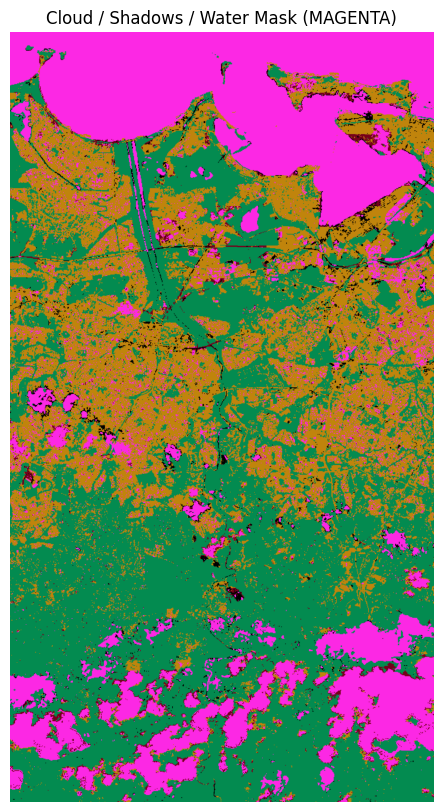

In [23]:
# converting SCL to RGB
scl_rgba_clean = colorize(xx       = cleaned_data.isel(time = time_slice).SCL.compute(), 
                          colormap = scl_colormap)


# setting figure size
plt.figure(figsize = (6, 10))
plt.imshow(scl_rgba_clean)


# titles and axis labels
plt.title(label = "Cloud / Shadows / Water Mask (MAGENTA)")
plt.axis('off')


# rendering the plot
plt.show()

In [32]:
# preparing two time steps compare NDVI outputs
first_time  = 3 #pre
second_time = 47 #post

first_time_1  = 8 #pre
second_time_1 = 46 #post

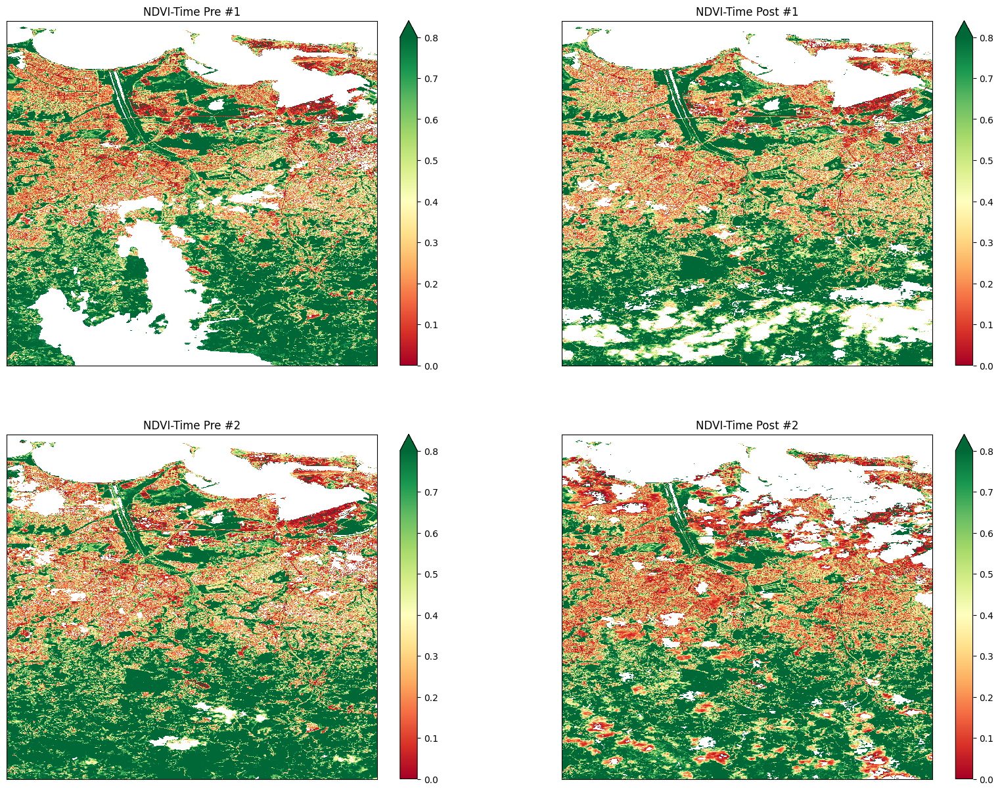

In [40]:
# Plots of NDVI at two different time slices
# Clouds, Shadows and Water are masked

# setting figure size
fig, ax = plt.subplots(2, 2, figsize = (20, 15))


#prepare images
ndvi_image = (cleaned_data.nir - cleaned_data.red) / (cleaned_data.nir + cleaned_data.red)

# first image data
ndvi_image.isel(time = first_time).plot(ax = ax[0][0],
                                         vmin = 0.0,
                                         vmax = 0.8,
                                         cmap = "RdYlGn")


# second image data
ndvi_image.isel(time = second_time).plot(ax = ax[0][1],
                                         vmin = 0.0,
                                         vmax = 0.8,
                                         cmap = "RdYlGn")

# 3rd image data
ndvi_image.isel(time = first_time_1 ).plot(ax = ax[1][0],
                                         vmin = 0.0,
                                         vmax = 0.8,
                                         cmap = "RdYlGn")

# 4th image data
ndvi_image.isel(time = second_time_1 ).plot(ax = ax[1][1],
                                         vmin = 0.0,
                                         vmax = 0.8,
                                         cmap = "RdYlGn")


# axis labels
ax[0][0].set_title(label = 'NDVI-Time Pre #1'), ax[0][0].xaxis.set_visible(False), ax[0][0].yaxis.set_visible(False)
ax[0][1].set_title(label = 'NDVI-Time Post #1'), ax[0][1].xaxis.set_visible(False), ax[0][1].yaxis.set_visible(False)
ax[1][0].set_title(label = 'NDVI-Time Pre #2'), ax[1][0].xaxis.set_visible(False), ax[1][0].yaxis.set_visible(False)
ax[1][1].set_title(label = 'NDVI-Time Post #2'), ax[1][1].xaxis.set_visible(False), ax[1][1].yaxis.set_visible(False)


# rendering the plot
plt.show()

## NDVI Anomalies
Here we inspect differences in vegetation level throughout all land areas. Some parts of the image could be covered with clouds thus we use 3 different combinations of pre and post photos to see the whole are as a result. In places with highest color differences we expect to see significant damage to the buildings.

In [36]:
# function for calculating NDVI anomalies
def NDVI(dataset):
    return (dataset.nir - dataset.red) / (dataset.nir + dataset.red)

In [37]:
# running comparison
ndvi_clean = NDVI(cleaned_data)

In [41]:
# calculating difference for 3 and 47
ndvi_pre     = ndvi_clean.isel(time = first_time)
ndvi_post    = ndvi_clean.isel(time = second_time)
ndvi_anomaly = ndvi_post - ndvi_pre

# calculating difference for 8 and 46
ndvi_pre_1     = ndvi_clean.isel(time = first_time_1)
ndvi_post_1    = ndvi_clean.isel(time = second_time_1)
ndvi_anomaly_1 = ndvi_post_1 - ndvi_pre_1

# calculating difference for 8 and 47
ndvi_anomaly_2 = ndvi_post - ndvi_pre_1


# all areas of water or clouds will be black
RdYlGn.set_bad('black',1.)


# reversing the colormap for reds
Reds_reverse = "Reds_r"

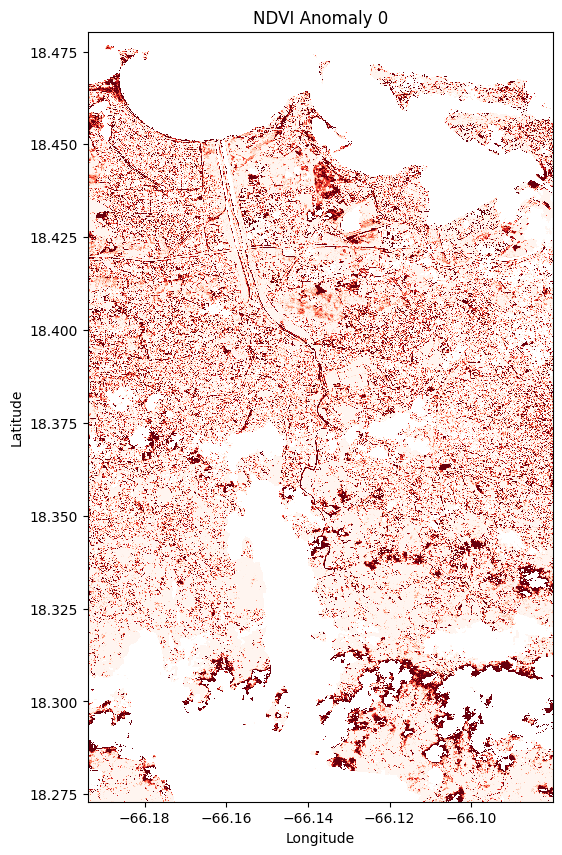

In [43]:
## plotting NDVI anomaly
plt.figure( figsize = (6,10) )
ndvi_anomaly.plot(vmin = -0.2, vmax=0.0, cmap = Reds_reverse, add_colorbar=False)


# titles and labels
plt.title (label  = "NDVI Anomaly 0")
plt.xlabel(xlabel = "Longitude")
plt.ylabel(ylabel = "Latitude")


# rendering the plot
plt.show()

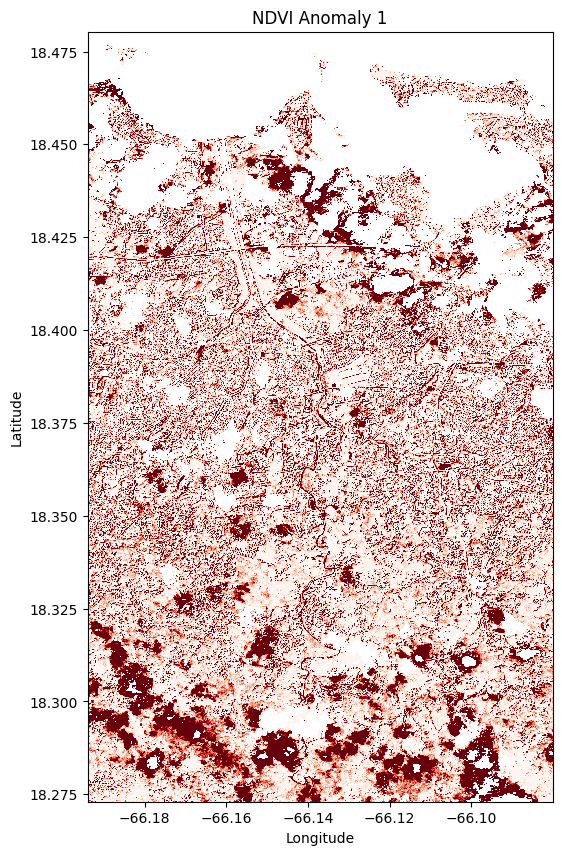

In [44]:
## plotting NDVI anomaly
plt.figure( figsize = (6,10) )
ndvi_anomaly_1.plot(vmin = -0.2, vmax=0.0, cmap = Reds_reverse, add_colorbar=False)


# titles and labels
plt.title (label  = "NDVI Anomaly 1")
plt.xlabel(xlabel = "Longitude")
plt.ylabel(ylabel = "Latitude")


# rendering the plot
plt.show()

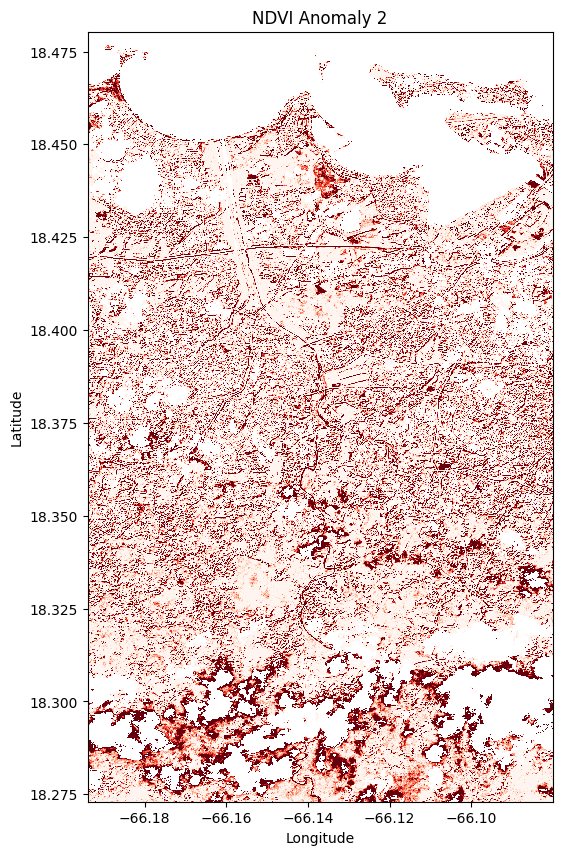

In [45]:
## plotting NDVI anomaly
plt.figure( figsize = (6,10) )
ndvi_anomaly_2.plot(vmin = -0.2, vmax=0.0, cmap = Reds_reverse, add_colorbar=False)


# titles and labels
plt.title (label  = "NDVI Anomaly 2")
plt.xlabel(xlabel = "Longitude")
plt.ylabel(ylabel = "Latitude")


# rendering the plot
plt.show()

Hurricanes work in such a way where they have ‘calm eye’ in the middle, followed by a stronger wall of winds which extends with heavy rains to thousands of kilometers. They also become weaker at the coller water and once they get further from water. So we noticed some areas being particularly damaged although some buildings looked untouched. Beside that, we noticed that the most impact from the hurricane happened in the poorer areas. The materials of the houses weren't able to withstand the impact and on most images we can see pieces of roof materials on the ground beside buildings which indicates that this rationale works. (NASA, 2024)

# Model Creation

We upload 2 pre-trained models which we were training on GPUs (Those were rented at runpod.io).

(In the comments we left the code we used for training and data downloading)

In the end we show results and performance of the best model, which is used to make final predictions as well.

In [47]:
#model trained on huge dataset
model = YOLO('/Users/macbookair13m22022/Downloads/train11/weights/best.pt')

#model trained on our manually-labeled dataset
model_2 = YOLO('/Users/macbookair13m22022/Downloads/train5222/weights/best.pt')

In [48]:
model.info()

Model summary: 365 layers, 68156460 parameters, 0 gradients, 258.1 GFLOPs


(365, 68156460, 0, 258.13867519999997)

In [49]:
model_2.info()

Model summary: 365 layers, 68156460 parameters, 0 gradients, 258.1 GFLOPs


(365, 68156460, 0, 258.13867519999997)

In [ ]:
#This is how to get our dataset (if needed)
# !pip install roboflow

# from roboflow import Roboflow
# rf = Roboflow(api_key="dnsnQIJiOmaJ6AWlNb8u")
# project = rf.workspace("bciii-new").project("nasa-google-maps")
# version = project.version(2)
# dataset = version.download("yolov8")

In [ ]:
#This is how the model was trained
# Train the model on the dataset for 50 epochs
#results = model.train(data   = './Damaged-Buildings-1/data.yaml',
                      # epochs = 100  ,
                      # imgsz  = 512,
                      # batch = 32,
                      # flipud = 0.5,
                      # fliplr = 0.5,
                      # hsv_s = 0.8,
                      # hsv_v = 0.6,
                      # scale = 1,
                      # degrees = 180,
                      # mosaic = 0.5,
                      # mixup = 0.5,
                      # copy_paste = 0.5,
                      # device = 'cuda')

In [50]:
#Use sample dataset to see some part of results (sample dataset has to be downloaded and be in the same folder with this code)
model.val()

Ultralytics YOLOv8.2.2 🚀 Python-3.11.0 torch-2.1.2 CPU (Apple M2)
Model summary (fused): 268 layers, 68127420 parameters, 0 gradients, 257.4 GFLOPs


val: Scanning /Users/macbookair13m22022/Downloads/Damaged-Buildings-1/valid/labe

val: New cache created: /Users/macbookair13m22022/Downloads/Damaged-Buildings-1/valid/labels.cache



                 Class     Images  Instances      Box(P          R      mAP50  m


                   all          2         47        0.8      0.918      0.914      0.805
damagedresidentialbuilding          2         13      0.699      0.894      0.846       0.74
undamagedresidentialbuilding          2         34      0.902      0.941      0.982       0.87
Speed: 2.8ms preprocess, 760.7ms inference, 0.0ms loss, 375.1ms postprocess per image
Results saved to runs/detect/val


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([1, 3])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x2b59bf610>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
          0.048048, 

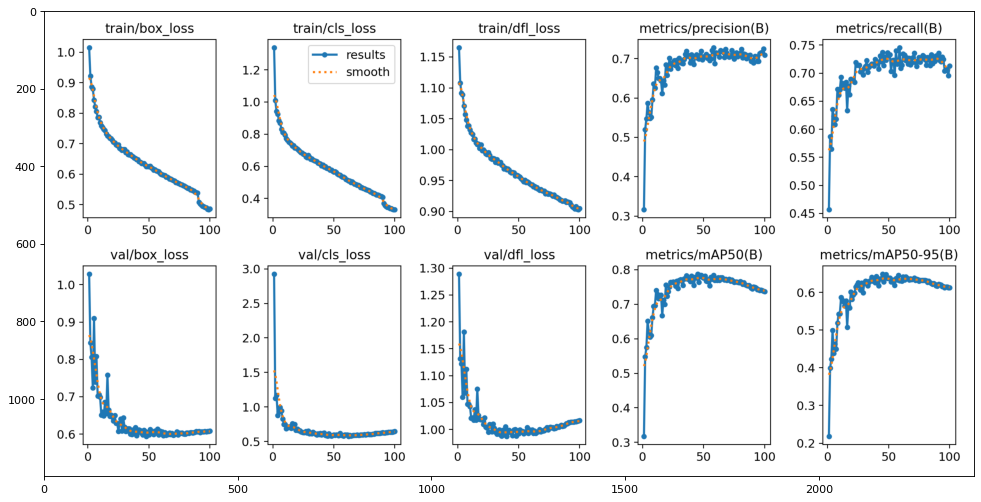

In [52]:
#100 epochs is too much for batch size equal 32
#Model starts to overfit
#However YOLO automatically chooses the best iteration

figure(figsize=(15, 10), dpi=80)
# reading the image 
results = img.imread('/Users/macbookair13m22022/Downloads/train11/results.png') # change this as needed
# displaying the image 
plt.imshow(results) 
plt.show()

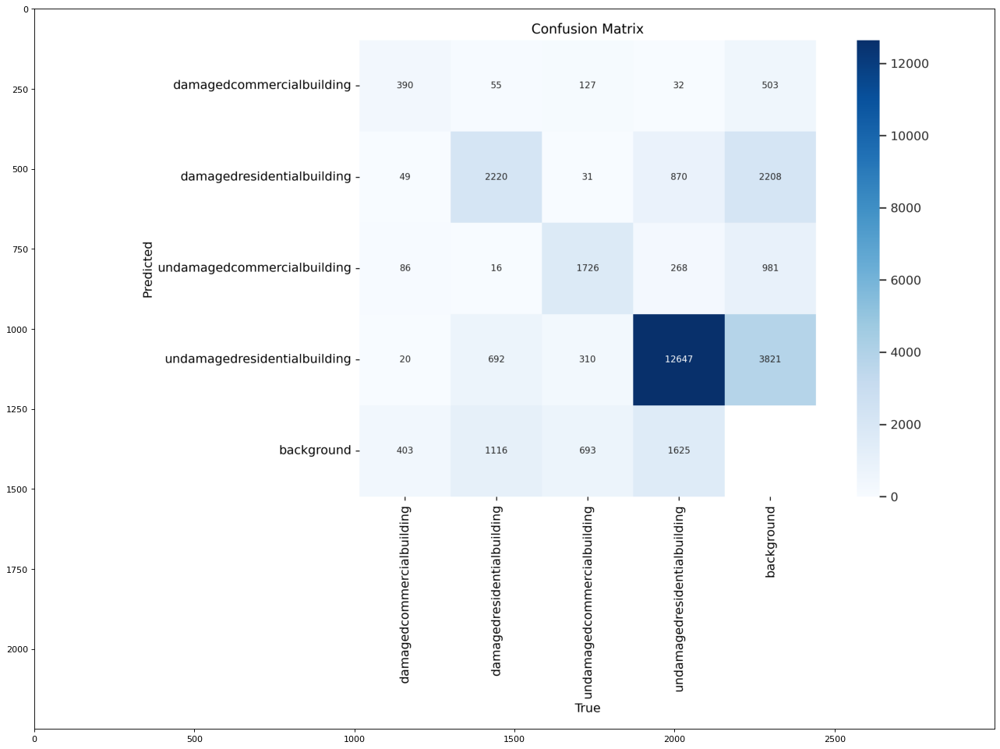

In [53]:
#confution matrix of our validation dataset
figure(figsize=(20,15), dpi=80)  
# reading the image 
cf = img.imread('/Users/macbookair13m22022/Downloads/train11/confusion_matrix.png') # change this as needed
# displaying the image 
plt.imshow(cf) 
plt.show()

# Submission 

Here we just predict labels for validation dataset provided.

In [54]:
# Decoding according to the .yaml file class names order
decoding_of_predictions ={0: 'undamagedcommercialbuilding', 1: 'undamagedresidentialbuilding', 2: 'damagedresidentialbuilding', 3: 'damagedcommercialbuilding'}

directory = './Submission Data (12 images)'
# Directory to store outputs
results_directory = 'Validation_Data_Results'

# Create submission directory if it doesn't exist
if not os.path.exists(results_directory):
    os.makedirs(results_directory)

# Loop through each file in the directory
for filename in os.listdir(directory):
    # Check if the current object is a file and ends with .jpeg
    if os.path.isfile(os.path.join(directory, filename)) and filename.lower().endswith('.jpg'):
        # Perform operations on the file
        file_path = os.path.join(directory, filename)
        print(file_path)
        print("Making a prediction on ", filename)
        results = model.predict(file_path, save=True, iou=0.5, save_txt=True, conf=0.25)
        
        for r in results:
            conf_list = r.boxes.conf.numpy().tolist()
            clss_list = r.boxes.cls.numpy().tolist()
            original_list = clss_list
            updated_list = []
            for element in original_list:
                 updated_list.append(decoding_of_predictions[int(element)])

        bounding_boxes = r.boxes.xyxy.numpy()
        confidences = conf_list
        class_names = updated_list

        # Check if bounding boxes, confidences and class names match
        if len(bounding_boxes) != len(confidences) or len(bounding_boxes) != len(class_names):
            print("Error: Number of bounding boxes, confidences, and class names should be the same.")
            continue
        text_file_name = os.path.splitext(filename)[0]
        # Creating a new .txt file for each image in the submission_directory
        with open(os.path.join(results_directory, f"{text_file_name}.txt"), "w") as file:
            for i in range(len(bounding_boxes)):
                # Get coordinates of each bounding box
                left, top, right, bottom = bounding_boxes[i]
                # Write content to file in desired format
                file.write(f"{class_names[i]} {confidences[i]} {left} {top} {right} {bottom}\n")
        print("Output files generated successfully.")



./Submission Data (12 images)/Validation_Post_Event_009.jpg
Making a prediction on  Validation_Post_Event_009.jpg

image 1/1 /Users/macbookair13m22022/Downloads/Submission Data (12 images)/Validation_Post_Event_009.jpg: 512x512 7 damagedcommercialbuildings, 8 damagedresidentialbuildings, 12 undamagedcommercialbuildings, 8 undamagedresidentialbuildings, 963.3ms
Speed: 15.7ms preprocess, 963.3ms inference, 11.5ms postprocess per image at shape (1, 3, 512, 512)
Results saved to runs/detect/predict
1 label saved to runs/detect/predict/labels
Output files generated successfully.
./Submission Data (12 images)/Validation_Post_Event_008.jpg
Making a prediction on  Validation_Post_Event_008.jpg

image 1/1 /Users/macbookair13m22022/Downloads/Submission Data (12 images)/Validation_Post_Event_008.jpg: 512x512 1 damagedcommercialbuilding, 9 damagedresidentialbuildings, 1 undamagedcommercialbuilding, 11 undamagedresidentialbuildings, 743.6ms
Speed: 0.8ms preprocess, 743.6ms inference, 0.5ms postproc

In [55]:
# Define your source directory and the destination where the zip file will be created
source_dir = results_directory
destination_zip = 'submission'

# Create a zip file from the directory
shutil.make_archive(destination_zip, 'zip', source_dir)

print(f"Directory {source_dir} has been successfully zipped into {destination_zip}.")

Directory Validation_Data_Results has been successfully zipped into submission.
